**CREDIT CARD FRAUD DETECTION**

**Introduction**

Credit card fraud is a major problem that costs businesses and consumers billions of dollars each year. Early detection of fraudulent transactions can help to minimize these losses.

One way to detect fraudulent transactions is to build a machine learning model. This model can be trained on a dataset of historical credit card transactions, including both fraudulent and legitimate transactions. The model can then be used to classify new transactions as fraudulent or legitimate.

There are a variety of machine learning algorithms that can be used for credit card fraud detection. Two common algorithms are logistic regression and random forests.

Logistic regression is a simple but effective algorithm for binary classification problems, such as credit card fraud detection. Logistic regression models the probability of a transaction being fraudulent based on a set of features, such as the amount of the transaction, the time of day, and the merchant type.

Random forests are an ensemble learning algorithm that combines the predictions of multiple decision trees to produce a final prediction. Random forests are more complex than logistic regression models, but they can be more accurate, especially for complex datasets.

Once a machine learning model has been trained, it can be used to classify new transactions as fraudulent or legitimate. This can be done by feeding the transaction features to the model and obtaining the model's prediction.

**DATA**

This is a simulated credit card transaction dataset containing legitimate and fraud transactions from the duration 1st Jan 2019 - 31st Dec 2020..
It covers credit cards of 1000 customers doing transactions with a pool of 800 merchants.

In [1]:
# @title Libraries
import pandas as pd
import numpy as np
from datetime import datetime, date

# preprocessing
from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedShuffleSplit


# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

# preprocessing
from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn import preprocessing

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve, auc

# save and load models
import joblib
from tensorflow.keras.models import load_model
# Models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.linear_model import LogisticRegression
import xgboost as xgb

# Evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve, auc

# save and load models
import joblib
from tensorflow.keras.models import load_model

In [2]:
# @title Data Extraction & Loading
df = pd.read_csv("/content/drive/MyDrive/credit card fraud detection /fraudTrain.csv")
test_data = pd.read_csv("/content/drive/MyDrive/credit card fraud detection /fraudTest.csv")

In [3]:
print("rows: ",df.shape[0])
print("columns: ",df.shape[1])

rows:  1296675
columns:  23


In [4]:
df.head(2)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0


In [5]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud'],
      dtype='object')

**Data Understanding**

Functions

EDA

In [13]:
# @title Functions
def plot_featureToClass(col, classtype):
    '''
    Creates a plot of time based on the class type

    Args :
    - col: column name to plot
    - classtype: class type (fraud or non fraud)

    Output : None
    '''
    new_df = df[col].where(df['is_fraud'] == classtype)
    new_df = new_df.dropna()
    plt.plot(new_df)
    plt.show()

In [14]:
def handle_outlier(col, threshold=1.5):
    '''
    Function that gets maximum and minimum values for provided column

    Args:
        col (pandas.Series): Column name
        threshold (float): Threshold value for defining outliers

    Returns:
        tuple: The lower and upper bounds for outliers
    '''
    Q1, Q3 = col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower = Q1 - (threshold * IQR)
    upper = Q3 + (threshold * IQR)
    return lower, upper

In [15]:
def draw_boxplot(colname):
    '''
    Creates a boxplot for the specified column

    Args:
        colname (str): Column name

    Returns:
        None
    '''
    sns.boxplot(df[colname])
    plt.xlabel(colname)
    plt.ylabel('Value')
    plt.title(f'Boxplot of {colname}')
    plt.show()

In [16]:
def boxplot_feature_vs_class(feature,dataframe):
    '''
    Creates a boxplot for every feature vs class type

    Args: col (str) feature name

    Output : Boxplot
    '''
    sns.boxplot(x="is_fraud", y=feature, data=dataframe)
    plt.xlabel("is_fraud")
    plt.ylabel(feature)
    plt.title(f"Relationship between {feature} and is_fraud")
    plt.show()

In [6]:
# @title EDA : Analyze distribution of the target variable
print('0 - NonFraud :', df['is_fraud'].value_counts()[0])
print('1 - Fraud :', df['is_fraud'].value_counts()[1])

0 - NonFraud : 1289169
1 - Fraud : 7506


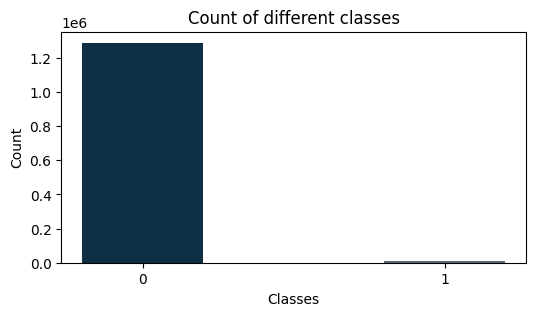

In [7]:
# creating the dataset
data = {'0':1289169, '1':7506}
classes = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (6, 3))

colors = ['#0E2F44', '#566D7C']

# creating the bar plot
plt.bar(classes, values, color = colors,
        width = 0.4)

plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Count of different classes")
plt.show()

There are 7506 frauds out of 1,289,169 transactions which meabs that the data is highly unbalanced
If we use this dataframe as the foundation for our prediction models and analysis, we may encounter many inaccuracies and the algorithms will likely overfit since it will "assume" that most transactions are non-fraud.

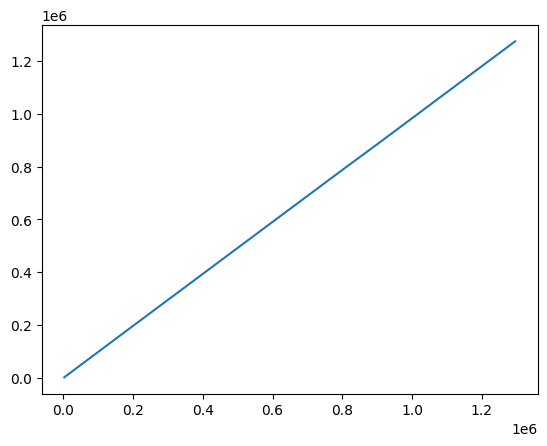

In [17]:
# Fraud
plot_featureToClass('unix_time',1)

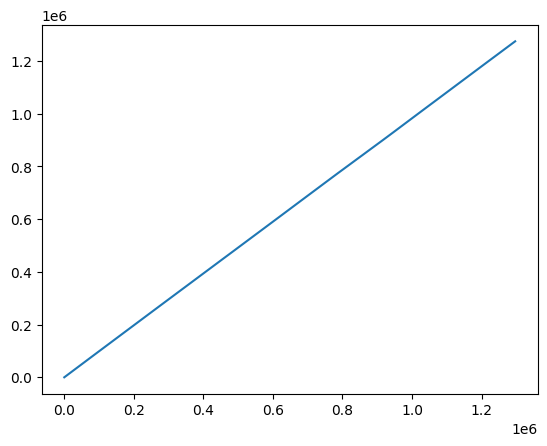

In [18]:
# Fraud
plot_featureToClass('unix_time',0)

Since the plot of the time variable does not show any distinguishable pattern or correlation between the time and the fraud cases compared to non-fraud cases,
It's suggested that the time alone may not be a strong indicator for fraud detection

In [19]:
fig = px.histogram(df, x="unix_time", y="amt", color="is_fraud", barmode="group", hover_data=df.columns, color_discrete_sequence=['#45818e','#134f5c'])

fig.show()

Data preparation

In [8]:
# @title Training Data
df["trans_date_trans_time"] = pd.to_datetime(df["trans_date_trans_time"], infer_datetime_format=True)
df["dob"] = pd.to_datetime(df["dob"], infer_datetime_format=True)

In [9]:
# @title Data Encoding
# Encode categorical data to numerical
label_encoder = preprocessing.LabelEncoder()
for col in df.columns:
    df[col]= label_encoder.fit_transform(df[col])

In [10]:
# @title Data Scaling
# Since most of our data has already been scaled we should scale the columns that are left to scale (Amount and Time)
# RobustScaler is less prone to outliers.
rob_scaler = RobustScaler()

for col in df.columns:
    if df[col].dtype =='object':
        df[col] = rob_scaler.fit_transform(df[col].values.reshape(-1,1))
    else:
        pass

**Data Splitting**

Stratified sampling is useful when the data contains imbalanced class distributions. When partitioning the data into training and testing sets, stratified sampling guarantees that the class proportions are preserved in both sets.
This is significant since it helps to avoid biassed or skewed judgements when working with  skewed data

In [22]:
X = df.drop(['is_fraud'],axis = 1)
y = df['is_fraud']

In [23]:
stratified_split = StratifiedShuffleSplit(n_splits=5, test_size=0.3, random_state=42)
for train_index, test_index in stratified_split.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

SMOTE Technique (Over-Sampling):

SMOTE is an algorithm used to address class imbalance in a dataset, where one class has significantly fewer samples than the other.

In [24]:
smote = SMOTE(random_state=42)
# Apply SMOTE to oversample the minority class
X_train_oversampled, y_train_oversampled = smote.fit_resample(X_train, y_train)

Modelling

In [25]:
# @title Logistic Regression
# Instantiate & train the model
lg_model = LogisticRegression(random_state=42)
lg_model.fit(X_train_oversampled, y_train_oversampled)

LogisticRegression(random_state=42)

In [26]:
lg_ypred = lg_model.predict(X_test)

# Evaluate performance
print("Accuracy score is: ",round(accuracy_score(y_test, lg_ypred)*100,2),'%')

Accuracy score is:  92.41 %


In [27]:
# Evaluate performance
print(classification_report(y_test, lg_ypred))
print("ROC-AUC:", roc_auc_score(y_test, lg_ypred))

              precision    recall  f1-score   support

           0       1.00      0.93      0.96    386751
           1       0.06      0.77      0.10      2252

    accuracy                           0.92    389003
   macro avg       0.53      0.85      0.53    389003
weighted avg       0.99      0.92      0.96    389003

ROC-AUC: 0.8461593899715989


In [28]:
# Create confusion matrix
lgconfusion_matrix = confusion_matrix(y_test, lg_ypred)

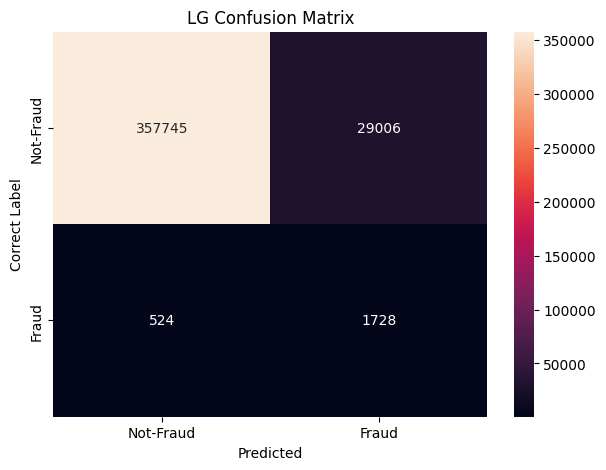

In [29]:
# Plot the confusion matrix heatmap
plt.figure(figsize=(7, 5))
plt.title('LG Confusion Matrix')
sns.heatmap(lgconfusion_matrix, annot=True, xticklabels=["Not-Fraud","Fraud"],
            yticklabels=["Not-Fraud","Fraud"], fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Correct Label')
plt.show()

The principles of sensitivty/recall and precision are crucial for evaluating fraud detection algorithms.
Recall measures how many fraud instances go unnoticed, *while precision * measures how good the model is at producing as few false predictions as possible.
It is essential to prioritise high recall for fraud detection in order to miss as few fraud instances as possible while simultaneously having a relatively high accuracy because too many false predictions might be an issue! The recall in the Logistic Regression model above is approximately 0.77, and the overall accuracy is around 0.92, which is less than the actual percentage of non-fraud instances in the testing dataset.

Both measures appear to indicate that,
the model does not help much in detecting fraud
furthermore, the model's Precision is just 0.06 too many false positives to be actually helpful!

Another approach, Random Forest, will now be tested to determine whether it may produce better results

In [30]:
# @title Random Forest
# Instantiate & train the model
rf_model= RandomForestClassifier()
rf_model.fit(X_train_oversampled, y_train_oversampled)

RandomForestClassifier()

In [31]:
# Test the model
rf_ypred = rf_model.predict(X_test)

# Evaluate performance
print("Acuuracy score is: ",round(accuracy_score(y_test, rf_ypred)*100,2),'%')

Acuuracy score is:  99.53 %


In [32]:
# Evaluate performance
print(classification_report(y_test, rf_ypred))
print("ROC-AUC:", roc_auc_score(y_test, rf_ypred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    386751
           1       0.58      0.72      0.64      2252

    accuracy                           1.00    389003
   macro avg       0.79      0.86      0.82    389003
weighted avg       1.00      1.00      1.00    389003

ROC-AUC: 0.856816141537967


In [33]:
# Create confusion matrix
rf_confusion_matrix = confusion_matrix(y_test, rf_ypred)

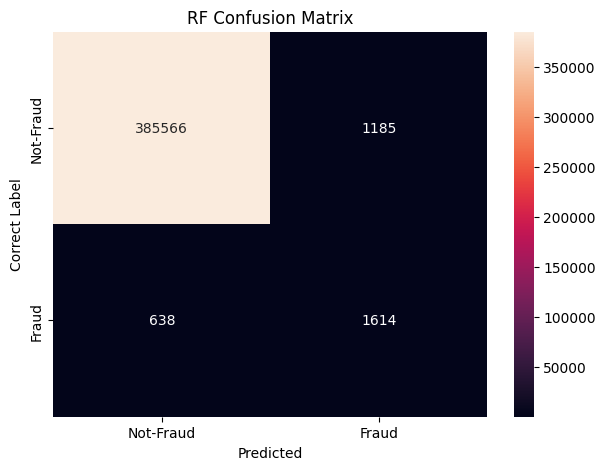

In [34]:
# Plot the confusion matrix heatmap
plt.figure(figsize=(7, 5))
plt.title('RF Confusion Matrix')
sns.heatmap(rf_confusion_matrix, annot=True, xticklabels=["Not-Fraud","Fraud"],
            yticklabels=["Not-Fraud","Fraud"], fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Correct Label')
plt.show()

The metrics above demonstrate that, while the Random Forest model has a somewhat lower recall, it has quite higher accuracy and precision! While the Random Forest model can provide a more solid foundation for future deployment, it still has to be improved, particularly in terms of recall.
This may entail optimising model hyperparameters, experimenting with alternative feature engineering techniques, or employing more complex ensemble methods.
Overall, the Random Forest model is an excellent starting point for fraud detection, but it requires more refinement to guarantee that it successfully captures all fraudulent situations while retaining high accuracy and precision.

The **conclusion** that can be drawn from the histogram is that fraudulent transactions are more likely to occur during certain times of day than others. The histogram shows that there are two peaks in fraudulent activity, one in the early morning hours and one in the late evening hours. This suggests that fraudsters are more likely to target credit card holders when they are less likely to be monitoring their accounts.

The histogram also shows that fraudulent transactions are typically larger than non-fraudulent transactions. This suggests that fraudsters are more likely to target large transactions in order to maximize their gains.

Overall, the histogram suggests that credit card fraud detection systems should focus on monitoring transactions that occur during the early morning and late evening hours, as well as transactions that are unusually large.

Here are some additional conclusions that can be drawn from the histogram:

The distribution of fraudulent transactions is different from the distribution of non-fraudulent transactions. Fraudulent transactions are more likely to be clustered around certain times of day, while non-fraudulent transactions are more evenly distributed throughout the day.
Fraudulent transactions are more likely to occur during off-peak hours. This suggests that fraudsters may be trying to avoid detection by targeting times when there is less activity on credit card networks.
The largest fraudulent transactions are more likely to occur during the early morning hours. This suggests that fraudsters may be targeting large transactions because they are more likely to be successful during these times.
These conclusions can be used to develop more effective credit card fraud detection systems. For example, fraud detection systems can be programmed to give more weight to transactions that occur during off-peak hours or transactions that are unusually large.